# DBBA Coursework 1

#### Name: Jingxiang Qi Student Number: S2590856

--------------------------------------------------------------------------------------------------------------------------------------------

### Instructions

#### Academic Misconduct

Please remember the good scholarly practice requirements of the University regarding work for
credit. You can find guidance at the School page

https://web.inf.ed.ac.uk/infweb/admin/policies/academic-misconduct

This also has links to the relevant University pages. 

**You are not allowed to collaborate with other students on this assignment or to ask or answer questions about the contents of the assignment. If you do not understand a specific question, ask Valerio and Ogy on Piazza.**

#### Submission Instructions

All the analysis must be done in this Jupyter Notebook and you should have a separate written report (without code) saved in PDF. Please fill out the fields bellow with the necessary code(remember to comment your code well) and discussion where needed. Code will generally
not be marked, but it will be checked by the markers to ensure that all the analysis is properly
done and the work is yours (i.e. there was no plagiarism). Focus on analysing the results you obtain as this is the main part that will be marked. Report your findings in a PDF file where you do not include any code but just the figures obtained and the conclusions you draw, i.e. plots and analysis. You will have to submit your files (final Jupyter Notebook and PDF) on Learn. Name your files with your
student number. For instance, if your student number is S123456789, you must submit a file
S123456789.zip containing the python source code and answers to the questions (PDF).

#### General Instructions 
In this coursework, you will analyse a real-world temporal network based on what you have learned in
class. Many exercises will require you to discuss the results of your analysis, some other will leave
you the choice of which algorithm to use for a particular task. This is by design because this
coursework assesses whether you understand network science and whether you can apply it to
real-world networks. For this reason, if you realise you need to make assumptions to answer a
question, do so and always, always motivate your assumptions and answers!

**Warning:** Some network metrics might require some time to compute. Please consider this when
doing the coursework and allow enough time to perform the required computations. Also
remember that you can use the School’s DICE machines, which can be let to run!

--------------------------------------------------------------------------------------------------------------------------------------------

#### Assignment Premises

You have been hired as a data analyst in the newly founded investment company DBBA Capital and have been tasked with the analysis of the investment patterns of one of our major competitors: Fairholme Capital, managed by Bruce Berkowitz. 

DBBA Capital wants you to evaluate the investment patterns of Fairholme Capital in relation to other superinvestors and evaluate the change in investment patterns during the pandemic. They have provided you with data about different superinvestors and the companies they invested in for each quarter spanning from quarter 1 (Q1) of 2019 to quarter 2 (Q2) of 2023 (that you can find in the folder named "Assignment Data"). 

The first column of each file represents the investors and the remaining columns represent the companies each investor invested in. First, familiarlise yourself with the data, and then, follow the steps bellow to perform the necessary analysis.

**TIP** When you believe it might help, make use of the information you have on the portfolio composition to comment and discuss your results.

#### Part 1: Network Creation

**Task 1.1 (7 marks)**<br>
In the field below, load the first Excel dataset ("2019_Q1.xlsx") and create a network out of the investors and companies in the following manner:

- the nodes of the network are all the investors in the first column of the dataset
- two investors (nodes) are connected with an edge if they have invested in the same company (e.g. Christopher Bloomstran - Semper Augustus and David Abrams - Abrams Capital Management will be connected because they both invested in GOOGL). 
- if two investors have invested in more than one common comapny, do *not* assign multiple edges between them. Instead, assign the number of common companies they have invested in as a weight to the edge connecting them.

After you built the network, extract the largest connected component and plot it. Remember to add the edge weights in your plot.

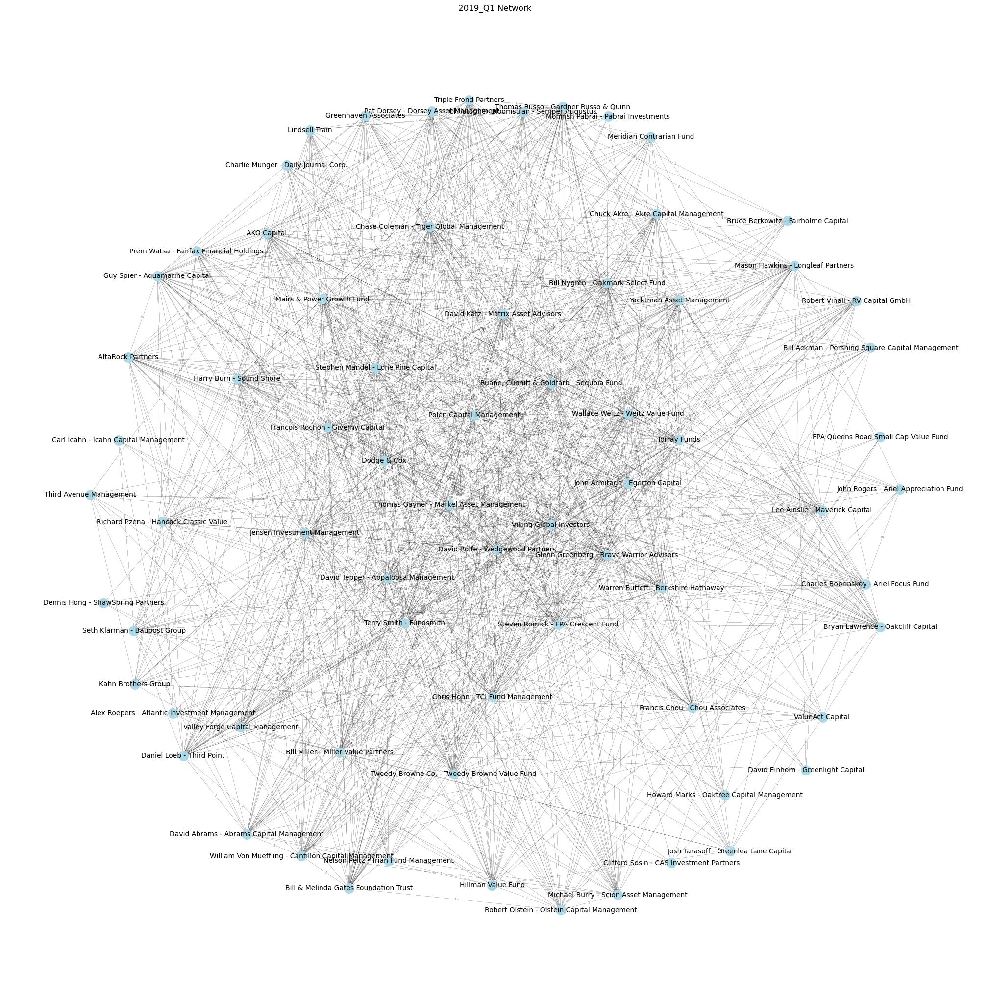

In [36]:
import os
import random
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# set up the network
def setup_network(filename):
    # load the dataset
    df = pd.read_excel(filename, header=None)
    investors = df.iloc[:, 0].tolist()
    # create a graph
    G = nx.Graph()

    # add nodes to the graph
    G.add_nodes_from(investors)

    # add edges to the graph
    for i in range(len(investors)):
        # get the name of investor_i
        investor_i = investors[i]
        # get the list of companies invested by investor_i
        invested_list_i = df.iloc[i, 1:].dropna().tolist()
        # compare this investor with the rest of investors
        for j in range(i+1, len(investors)):
            # get the name of investor_j
            investor_j = investors[j]
            # get the list of companies invested by investor_j
            invested_list_j = df.iloc[j, 1:].dropna().tolist()
            # compute the intersection of the two lists
            intersection_set = set(invested_list_i).intersection(set(invested_list_j))
            # if the intersection is not empty, add an edge between the two investors
            # set the weight of the edge to be the number of common companies they invested together
            if len(intersection_set) > 0:
                G.add_edge(investor_i, investor_j, weight=len(intersection_set))

    # extract the largest connected component
    largest_connected_component = max(nx.connected_components(G), key=len)
    # create a subgraph of the largest connected component
    subgraph = G.subgraph(largest_connected_component)
    return subgraph

# plot the network
def plot_network(G, title):
    # plot the graph
    plt.figure(figsize=(20, 20))
    
    pos = nx.spring_layout(
                            G, 
                            weight='weight',
                            k=6,
                            iterations=100
                        )
    nx.draw(
            G, pos, 
            with_labels=True, 
            node_color='lightblue', 
            node_size=200,
            width=0.15,
            font_size=10, 
            font_weight='light'
            )
    labels = nx.get_edge_attributes(G, 'weight')
    nx.draw_networkx_edge_labels(G, pos, edge_labels=labels, font_size=5, alpha=0.5)
    plt.title(title)
    plt.show()

whole_network = setup_network('./Assignment_Data/2019_Q1.xlsx')
plot_network(whole_network,'2019_Q1 Network')


**Note that the whole network here and hereafter represents the largest connected component of the network**

**Task 1.2 (3 marks)** <br>
Obtain the ego-network of 'Bruce Berkowitz - Fairholme Capital' and plot it.

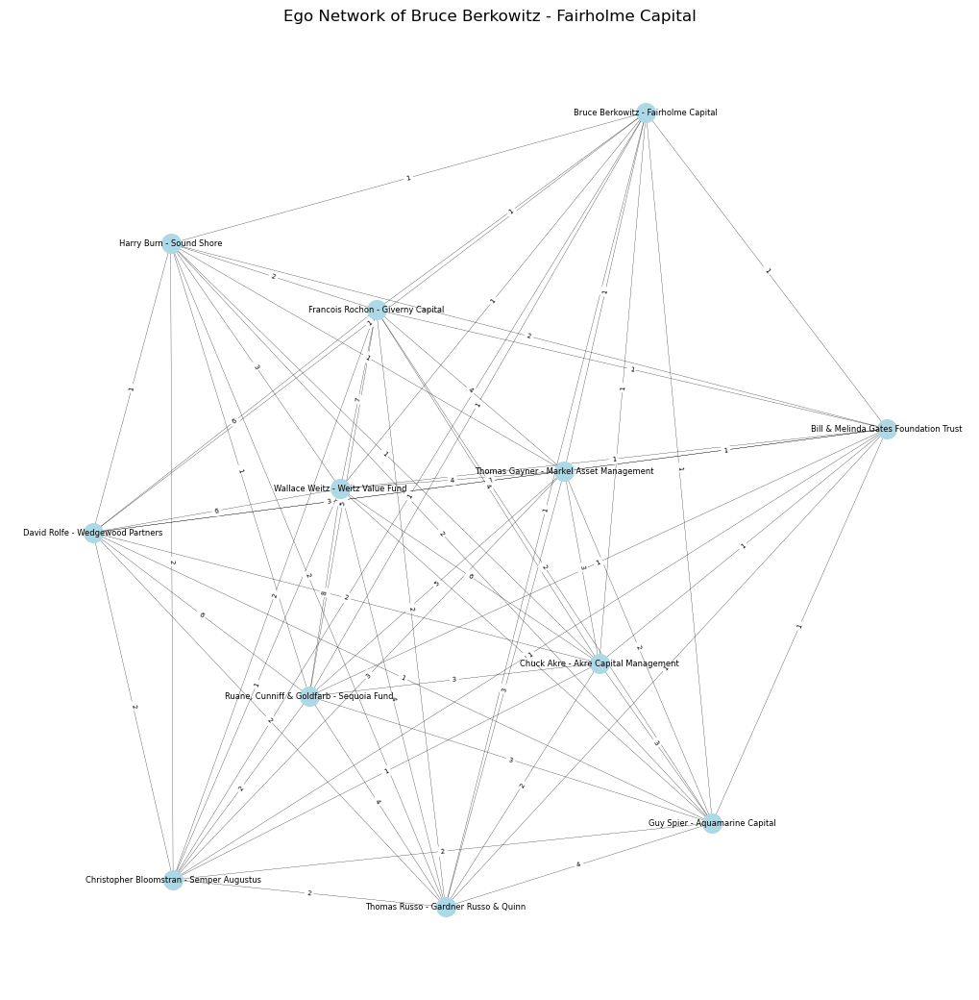

In [37]:

# setup the ego network
def setup_ego_network(ego_node, G):
    ego_network = nx.ego_graph(G, ego_node, radius=1)
    return ego_network

# plot the ego network
def plot_ego_network(ego_node, ego_network):
    # plot the ego network
    plt.figure(figsize=(10, 10))
    pos = nx.spring_layout(ego_network, weight='weight',k=6,iterations=100)
    nx.draw(ego_network, pos, with_labels=True, node_color='lightblue', node_size=200, width=0.2,font_size=6,font_weight='light')
    # show edge labels for edges 
    labels = nx.get_edge_attributes(ego_network, 'weight')
    nx.draw_networkx_edge_labels(ego_network, pos, edge_labels=labels, font_size=5)
    plt.title('Ego Network of ' + ego_node)
    plt.show()

ego_network = setup_ego_network('Bruce Berkowitz - Fairholme Capital',whole_network)
plot_ego_network('Bruce Berkowitz - Fairholme Capital', ego_network)



#### Part 2: Basic Network Analysis

**Task 2.1 (15 marks)** <br>
Now that you know how to build the network for a single quarter and get its largest connected component, repeat the procedure for all the other quarters. For both the whole network and the ego-network, produce a table with the summary statistics (i.e. mean, max, min, and standard deviation) of the following network quantities:

- Number of nodes
- Number of links
- Density
- Average clustering coefficient
- Average degrees
- Average strength
- Assortativity

If you need to make any assumption or decision regarding the metric to use to compute any of these quantities, clearly motivate it.

In [38]:

# get the summary statistics data of the network
def get_network_summary_statistics(G, filename):
    # compute the summary statistics
    num_nodes = G.number_of_nodes()
    num_links = G.number_of_edges()
    density = nx.density(G)
    avg_clustering_coeff = nx.average_clustering(G)
    avg_degrees = np.mean(list(dict(G.degree()).values()))
    avg_strength = np.mean(list(dict(G.degree(weight='weight')).values()))
    assortativity = nx.degree_assortativity_coefficient(G, weight='weight')
    return {
        'Quarter': os.path.basename(filename).split('.')[0],
        'Num Nodes': num_nodes,
        'Num Links': num_links,
        'Density': density,
        'Avg Clustering Coefficient': avg_clustering_coeff,
        'Avg Degrees': avg_degrees,
        'Avg Strength': avg_strength,
        'Assortativity': assortativity
    }

# display the summary statistics in table
def summary_table(results, title):
    # create a table of the summary statistics
    df = pd.DataFrame(results)
    df = df[['Quarter', 'Num Nodes', 'Num Links', 'Density', 'Avg Clustering Coefficient', 'Avg Degrees', 'Avg Strength', 'Assortativity']]
    df_des = df.describe().drop('count').drop('25%').drop('50%').drop('75%')
    df.set_index('Quarter', inplace=True)
    # set the title of the table
    df = df.style.set_caption(title)
    # display the table
    display(df)
    display(df_des)

whole_network_results = []
ego_network_results = []
# get the summary statistics for all the files in the folder
folder_path = './Assignment_Data'
files = os.listdir(folder_path)
files = sorted(files)

for file in files:
    if file.endswith('.xlsx'):
        filename = os.path.join(folder_path, file)
        # Get the whole network summary statistics
        graph = setup_network(filename)
        whole_network_result = get_network_summary_statistics(graph, filename)
        whole_network_results.append(whole_network_result)
        # Get the ego network summary statistics
        ego_network = setup_ego_network('Bruce Berkowitz - Fairholme Capital', graph)
        ego_network_result = get_network_summary_statistics(ego_network, filename)
        ego_network_results.append(ego_network_result)

summary_table(whole_network_results, 'Whole Network Summary Statistics')
summary_table(ego_network_results, 'Ego Network Summary Statistics')


,Num Nodes,Num Links,Density,Avg Clustering Coefficient,Avg Degrees,Avg Strength,Assortativity
Quarter,,,,,,,
2019_Q1,71,1070,0.430584,0.645887,30.140845,57.661972,0.039387
2019_Q2,72,1086,0.424883,0.656897,30.166667,57.111111,-0.002711
2019_Q3,74,1064,0.393928,0.635414,28.756757,53.351351,0.027168
2019_Q4,77,1187,0.405673,0.649873,30.831169,56.649351,0.010834
2020_Q1,77,1378,0.470950,0.694655,35.792208,71.012987,0.019800
2020_Q2,77,1360,0.464798,0.717500,35.324675,72.311688,0.013681
2020_Q3,77,1383,0.472659,0.711723,35.922078,73.662338,0.022120
2020_Q4,77,1367,0.467191,0.710125,35.506494,72.233766,0.012836
2021_Q1,77,1361,0.465140,0.711671,35.350649,69.922078,0.031967


,Num Nodes,Num Links,Density,Avg Clustering Coefficient,Avg Degrees,Avg Strength,Assortativity
mean,75.833333,1281.833333,0.451011,0.690152,33.766988,66.051131,0.049600
std,2.065116,110.554884,0.023784,0.026109,2.259138,6.194663,0.035099
min,71.000000,1064.000000,0.393928,0.635414,28.756757,53.351351,-0.002711
max,77.000000,1383.000000,0.474178,0.717500,35.922078,73.662338,0.106451


,Num Nodes,Num Links,Density,Avg Clustering Coefficient,Avg Degrees,Avg Strength,Assortativity
Quarter,,,,,,,
2019_Q1,12,66,1.000000,1.000000,11.000000,26.333333,-0.090909
2019_Q2,14,91,1.000000,1.000000,13.000000,31.428571,-0.076923
2019_Q3,16,108,0.900000,0.954029,13.500000,30.125000,-0.083761
2019_Q4,15,105,1.000000,1.000000,14.000000,34.133333,-0.071429
2020_Q1,18,129,0.843137,0.895962,14.333333,35.111111,-0.040679
2020_Q2,21,173,0.823810,0.927166,16.476190,42.000000,-0.043481
2020_Q3,29,309,0.761084,0.837963,21.310345,50.689655,-0.060394
2020_Q4,33,378,0.715909,0.825026,22.909091,50.606061,-0.043574
2021_Q1,30,292,0.671264,0.802458,19.466667,40.066667,0.004545


,Num Nodes,Num Links,Density,Avg Clustering Coefficient,Avg Degrees,Avg Strength,Assortativity
mean,27.777778,287.388889,0.764613,0.856062,19.358005,40.846762,-0.039398
std,9.181539,137.192496,0.133240,0.085626,4.370096,6.933676,0.033358
min,12.000000,66.000000,0.603129,0.755714,11.000000,26.333333,-0.090909
max,38.000000,439.000000,1.000000,1.000000,23.729730,50.689655,0.009002


**Task 2.2 (10 marks)** </br>
Discuss why ego networks are useful for exploring the importance of singular nodes. Then, comment on the statistics you computed above and what information they give you about the investment patterns of Bruce Berkowitz - Fairholme Capital. Briefly discuss how the ego network statistics differ from the statistics obtained for the whole network, explaining whether the differences or similarities are expected or not. Motivate your answers. 

**Discuss:**

1. As you can see in the first network of a single quarter, the network is too complex due to the number of nodes. It is very difficult to see the relationships of a singular node from it. So the ego-network provide a simple view of the networks that only contains the node needed to be focused. It can help to understand the role and impact of the node in its local environment. In addition to this if we want to find information about a particular node in the network, analyzing the ego network can also remove some useless interfering information and make the results more informative.
2. Because we focus on Bruce Berkowitz - Fairholme Capital, based on the data from the ego Network Summary Statistics above. First of all, it can be noticed that the number of nodes, the number of links and the average strength of the ego network has increased over time. This indicates that the number of companies invested by Bruce Berkowitz - Fairholme Capital is increasing. Secondly, it can also be noticed that the average clustering coefficient from 2019 Q1 to 2023 Q2 is overall large, but has a tendency to become smaller. This indicates that overall there is strong aggregation between nodes and nodes tend to connect to each other, but this tendency is getting weaker. In addition to this, Assortativity does not change from start to finish and stays around 0. This also shows that the connections between nodes are relatively random, are not affected by node attributes, connections are independent of the similarity between nodes. So overall from 2019 Q1 to 2023 Q2, Bruce Berkowitz - Fairholme Capital has been investing in more companies, but there is no strong similarity in the investment style of the companies with the same investment targets. Bruce Berkowitz - Fairholme Capital is still in a period of growth and the primary direction of its investments may be undetermined. Or perhaps the current strategy of his company is not to focus on specific types of companies, but to invest in all types of companies.
3.  If compare the data of ego network with whole network. First of all the number of nodes and the number of links will definitely decrease and the density could become larger because only neighbors of the specified nodes are shown, these changes are compatible with the actual data. Secondly due to focusing on only one particular node and neighbors, the nodes will be more connected to each other than whole network, so the clustering coefficient could increase. In addition to this, according to the average degree and average intensity in the table, it can be noticed that so Bruce Berkowitz - Fairholme Capital invests in a small number of companies, maybe even less than average, thus its average degree and average intensity have decreased. As for the assortativity, which represents the similarity between nodes, the value of assortativity in a large whole network is very low and tends to be close to 0, which means that the similarity between nodes is very low, thus, it is normal that assortativity is also very low in ego network. So overall these changes are to be expected if it is realized that Bruce Berkowitz - Fairholme Capital is not a very important node in the whole network.

#### Part 3: Comparing Degree Distributions

**Task 3.1 (8 marks)** </br>
Choose a single temporal slice (i.e. quarter) and plot and analyse the total degree and strength distributions of both the whole network and the ego-network. Comment on the similarities/differences between these networks. 

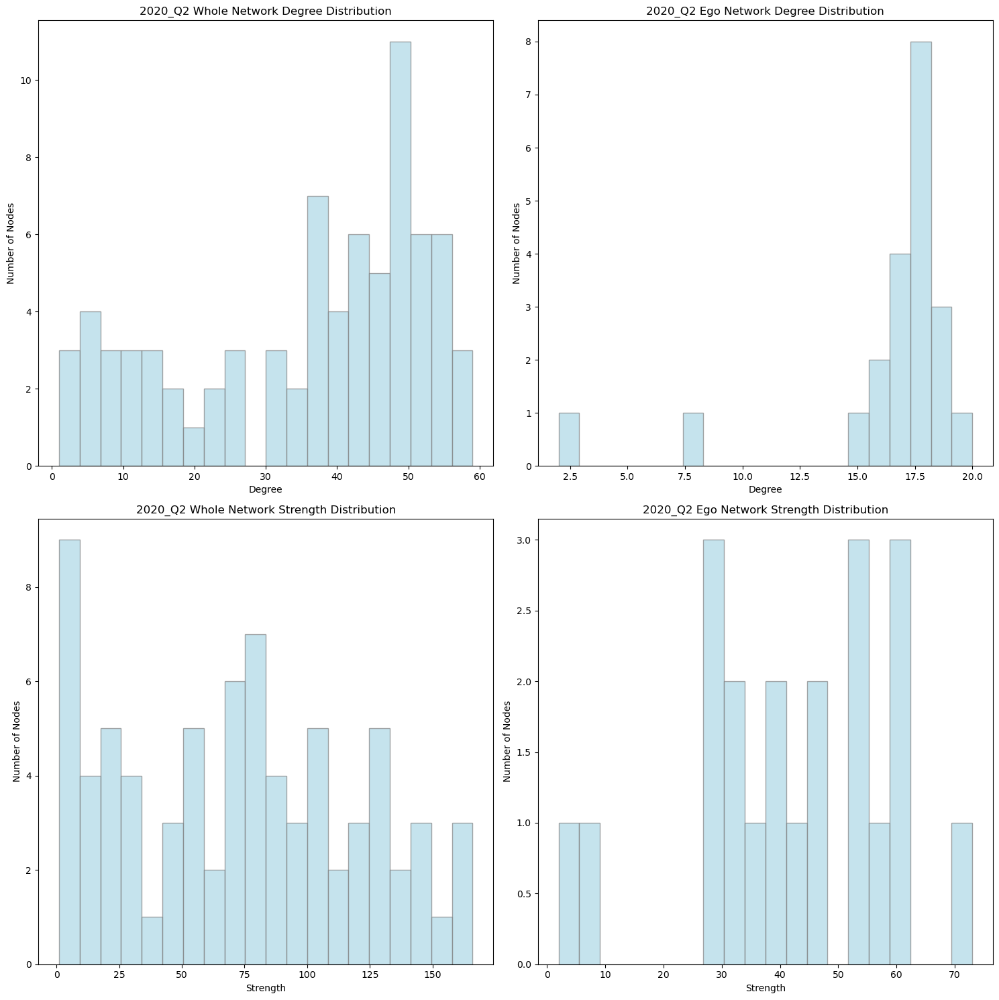

In [39]:

# plot the degree distribution
def plot_degree_distribution(G, title, ax):
    # get the degree information
    degree_values = list(dict(G.degree()).values())
    # plot the degree distribution
    ax.hist(degree_values, bins=20, color='lightblue',edgecolor='gray', alpha=0.7)
    ax.set_xlabel('Degree')
    ax.set_ylabel('Number of Nodes')
    ax.set_title(title + ' Degree Distribution')

# plot the strength distribution
def plot_strength_distribution(G, title, ax):
    # get the strength information
    strength = {}
    for node in G.nodes():
        total_strength = sum(G[node][neighbor]['weight'] for neighbor in G.neighbors(node))
        strength[node] = total_strength
    strength_values = list(strength.values())

    # plot the strength distribution
    ax.hist(strength_values, bins=20, color='lightblue',edgecolor='gray', alpha=0.7)
    ax.set_xlabel('Strength')
    ax.set_ylabel('Number of Nodes')
    ax.set_title(title + ' Strength Distribution')

# 2020_Q2
whole_network = setup_network('./Assignment_Data/2020_Q2.xlsx')
ego_network = setup_ego_network('Bruce Berkowitz - Fairholme Capital',whole_network)

# create a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(15, 15))

plot_degree_distribution(whole_network, '2020_Q2 Whole Network', axs[0, 0])
plot_degree_distribution(ego_network, '2020_Q2 Ego Network', axs[0, 1])
plot_strength_distribution(whole_network, '2020_Q2 Whole Network', axs[1, 0])
plot_strength_distribution(ego_network, '2020_Q2 Ego Network', axs[1, 1])

# display the plot
plt.tight_layout()
plt.show()

**Task 3.2 (7 marks)** </br> 
Based on degree distributions and the results you obtained, what type of network would you say the whole network and ego-network are (e.g scale free, random, etc)? Could have they been generated by any of the models discussed in class? Motivate your answer.

In [40]:
# random network / small world network

# make a random whole network
random_whole_network = nx.gnm_random_graph(len(whole_network.degree()), len(whole_network.edges()))
# assign random weights to the edges
for u, v in random_whole_network.edges():
    random_whole_network[u][v]['weight'] = random.randint(1, 20)

# make a random ego network
random_ego_network = nx.gnm_random_graph(len(ego_network.degree()), len(ego_network.edges()))
# assign random weights to the edges
for u, v in random_ego_network.edges():
    random_ego_network[u][v]['weight'] = random.randint(1, 20)

# get the clustering coefficient and average shortest path length of the random whole network and random ego network
random_whole_clustering_coefficient = nx.average_clustering(random_whole_network)
random_whole_avg_shortest_path_length = nx.average_shortest_path_length(random_whole_network)
random_ego_clustering_coefficient = nx.average_clustering(random_ego_network)
random_ego_avg_shortest_path_length = nx.average_shortest_path_length(random_ego_network)

# get the clustering coefficient and average shortest path length of the whole network and ego network
whole_network_clustering_coefficient = nx.average_clustering(whole_network)
whole_network_shortest_path_length = nx.average_shortest_path_length(whole_network)
ego_network_clustering_coefficient = nx.average_clustering(ego_network)
ego_network_shortest_path_length = nx.average_shortest_path_length(ego_network)

# create a dictionary with the data
data = {'Network Type': ['Random Whole Network', 'Random Ego Network', 'Whole Network', 'Ego Network'],
    'Clustering Coefficient': [random_whole_clustering_coefficient, random_ego_clustering_coefficient, whole_network_clustering_coefficient, ego_network_clustering_coefficient],
    'Average Shortest Path Length': [random_whole_avg_shortest_path_length, random_ego_avg_shortest_path_length, whole_network_shortest_path_length, ego_network_shortest_path_length]}

# create a dataframe from the dictionary
df = pd.DataFrame(data)

# print the dataframe
display(df)


,Network Type,Clustering Coefficient,Average Shortest Path Length
0,Random Whole Network,0.466285,1.535202
1,Random Ego Network,0.818921,1.176190
2,Whole Network,0.717500,1.584074
3,Ego Network,0.927166,1.176190


**Discuss:**
1. We can see from the degree distributions drawn above that the distributions are not linear so it is clear that both whole network and ego network are not scale free networks. 
2. Then we should determine if the network is a small world network or random network.
   - First, generate two random networks using the same number of degrees and number of edges as in the whole network and ego network. According to the database, a company can invest up to 20 companies, so the weights in the random networks are also set to random numbers between 1 and 20. Then calculate the clustering coefficient and average path length of whole network, Ego network and these two random networks.
   - According to the final calculation results, it can be found that for whole network. The Clustering Coefficient of whole network is much larger than the random network, while for Average path length, the value of whole network is a little bit smaller than the random network but the difference is not significant. It can be found that the whole network has a larger Clustering Coefficient than the random network, which means that the nodes of the whole network are more connected to each other so the whole network is closer to the small world netwrok.
   - As for the ego network, the Clustering Coefficient of the ego network is slightly larger than the random network with the same size, while the Average path length is basically no difference. The ego network has a larger Clustering Coefficient than the random network, but the difference is not big as the whole network, so the network should still belong to the small world network, but it is very close to the random network.

Overall, the whole network is a small world network, and I would prefer to classify the ego network as a small world network but it's status is very close to a random network.


#### Part 4: Changes of the network statistics during the pandemic

**Task 4.1 (15 marks)** </br> Plot the temporal evolution of the quantities you computed in Part 2 for the ego network and the whole network compare the difference between the networks. For each quantity, discuss if it can be used for analysing the investment patterns of Bruce Berkowitz - Fairholme Capital over time. Based on your discussion, choose the quantities that you find important. What information you can draw about the change of those network statistics during the pandemic?

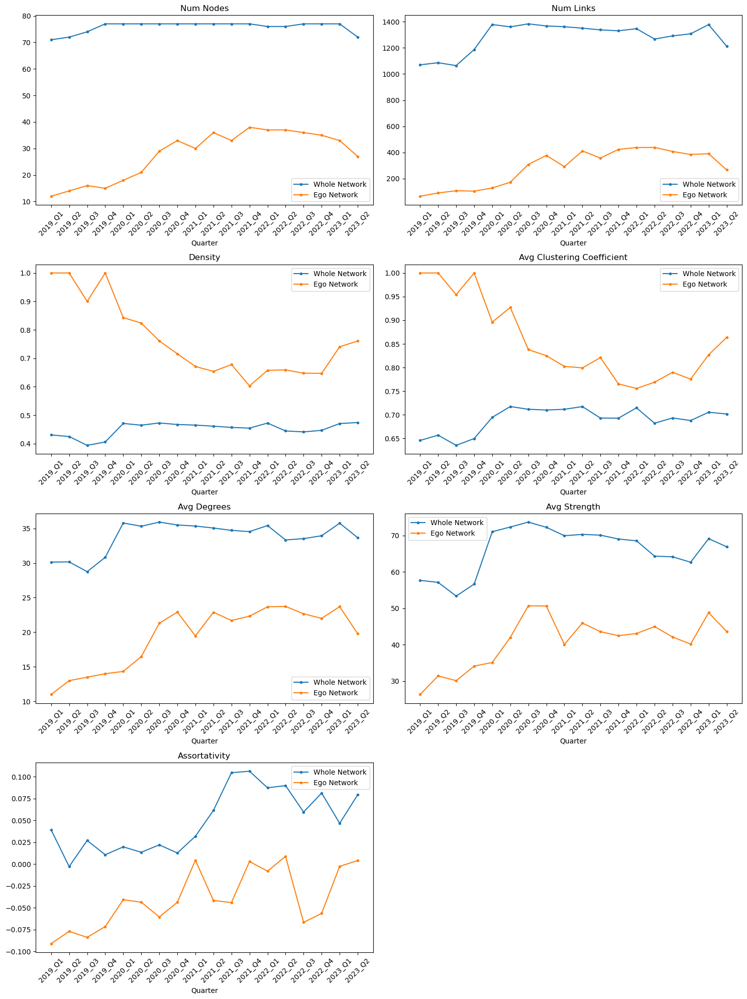

In [41]:

# create empty lists to store the summary statistics for each quarter
whole_network_results = []
ego_network_results = []

# get the summary statistics for all the files in the folder
folder_path = './Assignment_Data'
files = os.listdir(folder_path)
files = sorted(files)

for file in files:
    if file.endswith('.xlsx'):
        filename = os.path.join(folder_path, file)
        # setup the whole graph and ego network
        whole_network = setup_network(filename)
        ego_network = setup_ego_network('Bruce Berkowitz - Fairholme Capital', whole_network)

        # compute the summary statistics for the whole graph and ego network
        whole_network_summary = get_network_summary_statistics(whole_network, filename)
        ego_network_summary = get_network_summary_statistics(ego_network, filename)
        # append the summary statistics to the results lists
        whole_network_results.append(whole_network_summary)
        ego_network_results.append(ego_network_summary)

# display the dataframes
fig, axs = plt.subplots(4, 2, figsize=(15, 20))

whole_network_frame = pd.DataFrame(whole_network_results)
ego_network_frame = pd.DataFrame(ego_network_results)

# num_nodes
whole_network_frame.plot(ax=axs[0, 0],x='Quarter', y='Num Nodes', kind='line', title='Num Nodes', label='Whole Network', marker='.')
ego_network_frame.plot(ax=axs[0, 0],x='Quarter', y='Num Nodes', kind='line', title='Num Nodes', label='Ego Network', marker='.')
axs[0, 0].set_xticks(range(len(whole_network_frame['Quarter'])))
axs[0, 0].set_xticklabels(whole_network_frame['Quarter'],rotation=45)

# num_links
whole_network_frame.plot(ax=axs[0, 1],x='Quarter', y='Num Links', kind='line', title='Num Links', label='Whole Network', marker='.')
ego_network_frame.plot(ax=axs[0, 1],x='Quarter', y='Num Links', kind='line', title='Num Links', label='Ego Network', marker='.')
axs[0, 1].set_xticks(range(len(whole_network_frame['Quarter'])))
axs[0, 1].set_xticklabels(whole_network_frame['Quarter'],rotation=45)

# density
whole_network_frame.plot(ax=axs[1, 0],x='Quarter', y='Density', kind='line', title='Density', label='Whole Network', marker='.')
ego_network_frame.plot(ax=axs[1, 0],x='Quarter', y='Density', kind='line', title='Density', label='Ego Network', marker='.')
axs[1, 0].set_xticks(range(len(whole_network_frame['Quarter'])))
axs[1, 0].set_xticklabels(whole_network_frame['Quarter'],rotation=45)

# avg_clustering_coeff
whole_network_frame.plot(ax=axs[1, 1],x='Quarter', y='Avg Clustering Coefficient', kind='line', title='Avg Clustering Coefficient', label='Whole Network', marker='.')
ego_network_frame.plot(ax=axs[1, 1],x='Quarter', y='Avg Clustering Coefficient', kind='line', title='Avg Clustering Coefficient', label='Ego Network', marker='.')
axs[1, 1].set_xticks(range(len(whole_network_frame['Quarter'])))
axs[1, 1].set_xticklabels(whole_network_frame['Quarter'],rotation=45)

# avg_degrees
whole_network_frame.plot(ax=axs[2, 0],x='Quarter', y='Avg Degrees', kind='line', title='Avg Degrees', label='Whole Network', marker='.')
ego_network_frame.plot(ax=axs[2, 0],x='Quarter', y='Avg Degrees', kind='line', title='Avg Degrees', label='Ego Network', marker='.')
axs[2, 0].set_xticks(range(len(whole_network_frame['Quarter'])))
axs[2, 0].set_xticklabels(whole_network_frame['Quarter'],rotation=45)

# avg_strength
whole_network_frame.plot(ax=axs[2, 1],x='Quarter', y='Avg Strength', kind='line', title='Avg Strength', label='Whole Network', marker='.')
ego_network_frame.plot(ax=axs[2, 1],x='Quarter', y='Avg Strength', kind='line', title='Avg Strength', label='Ego Network', marker='.')
axs[2, 1].set_xticks(range(len(whole_network_frame['Quarter'])))
axs[2, 1].set_xticklabels(whole_network_frame['Quarter'],rotation=45)

# assortativity
whole_network_frame.plot(ax=axs[3, 0],x='Quarter', y='Assortativity', kind='line', title='Assortativity', label='Whole Network', marker='.')
ego_network_frame.plot(ax=axs[3, 0],x='Quarter', y='Assortativity', kind='line', title='Assortativity', label='Ego Network', marker='.')
axs[3, 0].set_xticks(range(len(whole_network_frame['Quarter'])))
axs[3, 0].set_xticklabels(whole_network_frame['Quarter'],rotation=45)

# set the last subplot to be invisible
axs[3, 1].set_visible(False)

plt.tight_layout()
plt.show()


**Tasks 4.2 (10 marks)** </br> Choose a suitable centrality measure that would give us imporatnt information about the nodes in the whole network, and clearly motivate your choice. Use this measure to find the 3 most central nodes for each quarter. Compare the centrality of Bruce Berkowitz - Fairholme Capital overtime with that of the most central nodes. What can you conclude from this?

,Quarter,TOP 1 Node Name,TOP 1 Node Centrality,TOP 2 Node Name,TOP 2 Node Centrality,TOP 3 Node Name,TOP 3 Node Centrality,Bruce Berkowitz - Fairholme Capital,Centrality Diff
0,2019_Q1,Wallace Weitz - Weitz Value Fund,0.247998,Polen Capital Management,0.242915,Stephen Mandel - Lone Pine Capital,0.224650,0.019811,0.228187
1,2019_Q2,Wallace Weitz - Weitz Value Fund,0.243926,Polen Capital Management,0.230649,Glenn Greenberg - Brave Warrior Advisors,0.216225,0.023413,0.220513
2,2019_Q3,Wallace Weitz - Weitz Value Fund,0.247853,Polen Capital Management,0.239261,Steven Romick - FPA Crescent Fund,0.230165,0.027065,0.220788
3,2019_Q4,Christopher Davis - Davis Advisors,0.238087,Wallace Weitz - Weitz Value Fund,0.229034,Steven Romick - FPA Crescent Fund,0.221963,0.025279,0.212807
4,2020_Q1,John Armitage - Egerton Capital,0.226178,Wallace Weitz - Weitz Value Fund,0.221153,Chris Hohn - TCI Fund Management,0.217779,0.022530,0.203647
5,2020_Q2,David Tepper - Appaloosa Management,0.222075,Wallace Weitz - Weitz Value Fund,0.221228,Chris Hohn - TCI Fund Management,0.210153,0.032160,0.189915
6,2020_Q3,John Armitage - Egerton Capital,0.241186,David Tepper - Appaloosa Management,0.216368,Wallace Weitz - Weitz Value Fund,0.211861,0.055792,0.185394
7,2020_Q4,David Tepper - Appaloosa Management,0.227937,John Armitage - Egerton Capital,0.219185,Daniel Loeb - Third Point,0.205384,0.060838,0.167098
8,2021_Q1,Polen Capital Management,0.242826,John Armitage - Egerton Capital,0.234461,Wallace Weitz - Weitz Value Fund,0.205514,0.045937,0.196889
9,2021_Q2,Polen Capital Management,0.245467,John Armitage - Egerton Capital,0.244261,Wallace Weitz - Weitz Value Fund,0.208847,0.055738,0.189729


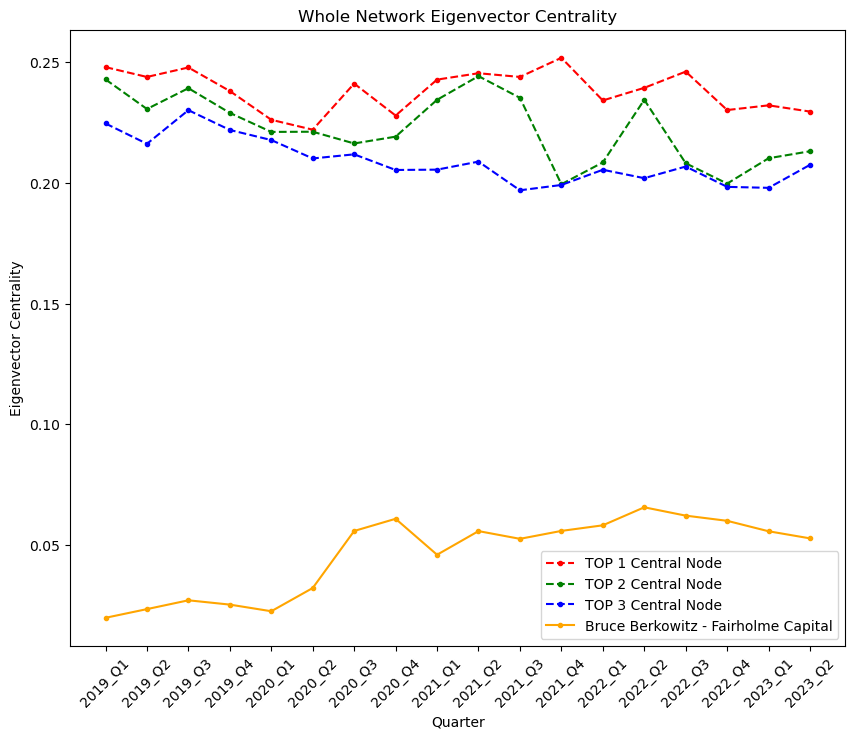

In [42]:

# get the eigenvector centrality
def get_eigenvector_centrality(G, filename, first_n, specific_node_name):
    
    # calculate eigenvector centrality for whole_network
    eigenvector_centrality = nx.eigenvector_centrality_numpy(G, weight='weight')
    # sort the nodes by eigenvector centrality
    sorted_nodes = sorted(eigenvector_centrality.items(), key=lambda x: x[1], reverse=True)
    # get the top n nodes
    sorted_nodes_list = sorted_nodes[:first_n]
    # get the specific node
    specific_node = [node for node in sorted_nodes if node[0] == specific_node_name][0]
    sorted_nodes_list.append(specific_node)

    return {
        'Quarter': os.path.basename(filename).split('.')[0],
        'TOP 1 Node Name': sorted_nodes_list[0][0],
        'TOP 1 Node Centrality': sorted_nodes_list[0][1],
        'TOP 2 Node Name': sorted_nodes_list[1][0],
        'TOP 2 Node Centrality': sorted_nodes_list[1][1],
        'TOP 3 Node Name': sorted_nodes_list[2][0],
        'TOP 3 Node Centrality': sorted_nodes_list[2][1],
        specific_node_name : specific_node[1]
    }


whole_network_centrality_results = []
# read all the files in the folder
folder_path = './Assignment_Data'
files = os.listdir(folder_path)
files = sorted(files)

for file in files:
    if file.endswith('.xlsx'):
        filename = os.path.join(folder_path, file)
        # setup the whole graph and ego network
        whole_network = setup_network(filename)
        # compute the eigenvector centrality for the whole graph and ego network
        whole_centrality = get_eigenvector_centrality(whole_network, filename, 3, 'Bruce Berkowitz - Fairholme Capital')
        # add the eigenvector centrality to the results lists
        whole_network_centrality_results.append(whole_centrality)


# display the dataframe
whole_network_frame = pd.DataFrame(whole_network_centrality_results)
# calculate the difference between Bruce Berkowitz - Fairholme Capital and TOP 1 Node Centrality
whole_network_frame['Centrality Diff'] = whole_network_frame['TOP 1 Node Centrality'] - whole_network_frame['Bruce Berkowitz - Fairholme Capital']
df_whole = whole_network_frame.style.set_caption("Whole Network")
display(df_whole)

# plot Whole Network Eigenvector Centrality
plt.figure(figsize=(10, 8))

plt.plot(whole_network_frame['Quarter'], whole_network_frame['TOP 1 Node Centrality'], linestyle='--', marker='.', color='red')
plt.plot(whole_network_frame['Quarter'], whole_network_frame['TOP 2 Node Centrality'], linestyle='--', marker='.', color='green')
plt.plot(whole_network_frame['Quarter'], whole_network_frame['TOP 3 Node Centrality'], linestyle='--', marker='.', color='blue')
plt.plot(whole_network_frame['Quarter'], whole_network_frame['Bruce Berkowitz - Fairholme Capital'], linestyle='-', marker='.', color='orange')

plt.title('Whole Network Eigenvector Centrality')
plt.xlabel('Quarter')
plt.ylabel('Eigenvector Centrality')
plt.xticks(range(len(whole_network_frame['Quarter'])), whole_network_frame['Quarter'], rotation=45)
plt.legend(['TOP 1 Central Node', 'TOP 2 Central Node', 'TOP 3 Central Node', 'Bruce Berkowitz - Fairholme Capital'])

plt.show()


**Discuss:**

- For the figure, I would like to explain that the companies represented by the TOP central nodes are always changing, and for a better visualization I have connected the TOP central nodes with a dotted line. This does not mean that the points on the same line represent the same company, the specific company names can be viewed in the table.
1. First we need to consider which centrality calculation method to use.
   - Degree Centrality considers degree only , and does not take into account the weights between nodes, so it is not chosen here.
   - Betweenness Centrality focuses more on the intermediary role between nodes connecting to other nodes and has no significance in our network so it is not considered.
   - Closeness Centrality focuses on the closeness of nodes to each other, in our network if we consider the weights as the distance between nodes. If two companies have invested together in many same companies, then it can be judged that they are close. But there is a issue with this, the closeness does not actually indicate the similarity of these two companies because this closeness does not take into account how much money these two companies have invested. If there is a company that invests in all companies, but invests a small amount of money in each company, that this company is close to all of the companies, then using Closeness Centrality can't give good results.
   - Eigenvector Centrality considers the centrality of other nodes connected to a node, and the importance of a node is influenced by the importance of the nodes connected to it. So for our investment network, the connections of companies that have the same investment object are getting calculated, which I think is relevant to our goal.
   - And Katz Centrality mainly focuses on the transmission between the nodes but in our network the transmission between the nodes is not important so Katz Centrality can't be used.
   
   So finally I chose to use Eigenvector Centrality for the computation.
2. For the final result, it can be found that:
   - Overall, it can be observed that the centrality of the most central nodes has been decreasing from 2019 Q1 to 2023 Q2, while the centrality of Bruce Berkowitz - Fairholme Capital has instead increased, which can also be seen in the centrality differences between Bruce Berkowitz - Fairholme Capital closing with the Top 1 central node.
   - Although overall Bruce Berkowitz - Fairholme Capital has increased in importance, it is also necessary to note that Bruce Berkowitz - Fairholme Capital has been falling since 2022 Q2. At the same time the Top 1 central node has also fallen a bit, which should indicate that at this time the market has made some changes and companies have fallen in importance slightly, I can't say for sure if this is related to the Russo-Ukrainian war that started in February 2022, but this is worth noticing in this part.
   - Apart from that, it is also noticeable that Bruce Berkowitz - Fairholme Capital didn't shine in 2019, but in 2020 Q1, when the pandemic started, Bruce Berkowitz - Fairholme Capital got a very rapid increase in importance. In my opinion Bruce Berkowitz - Fairholme Capital could be a very opportunistic company that sees the huge change in society when the pandemic starts, and the rich opportunities in that, and uses this period to get itself promoted. 
   
So all in all Bruce Berkowitz - Fairholme Capital is supposed to be a very risk averse and speculative company that is able to quickly take opportunities to improve at particular times and withstand the overall downward market environment. But its decline in recent quarters needs to be noted, and it's not a good sign if it keeps going down like this.

#### Part 5: Clustering and Modularity

**Task 5.1 (15 marks)** </br> Find the communities in each quarter in the whole network. To do so, use an algorithm of your choice, and justify your decision. Analyse how the communities evolve overtime, focussing on the membership of Bruce Berkowitz - Fairholme Capital. Does this node fall in the same community with the same superinvestors across different quarters? What conclusions can you draw from this?

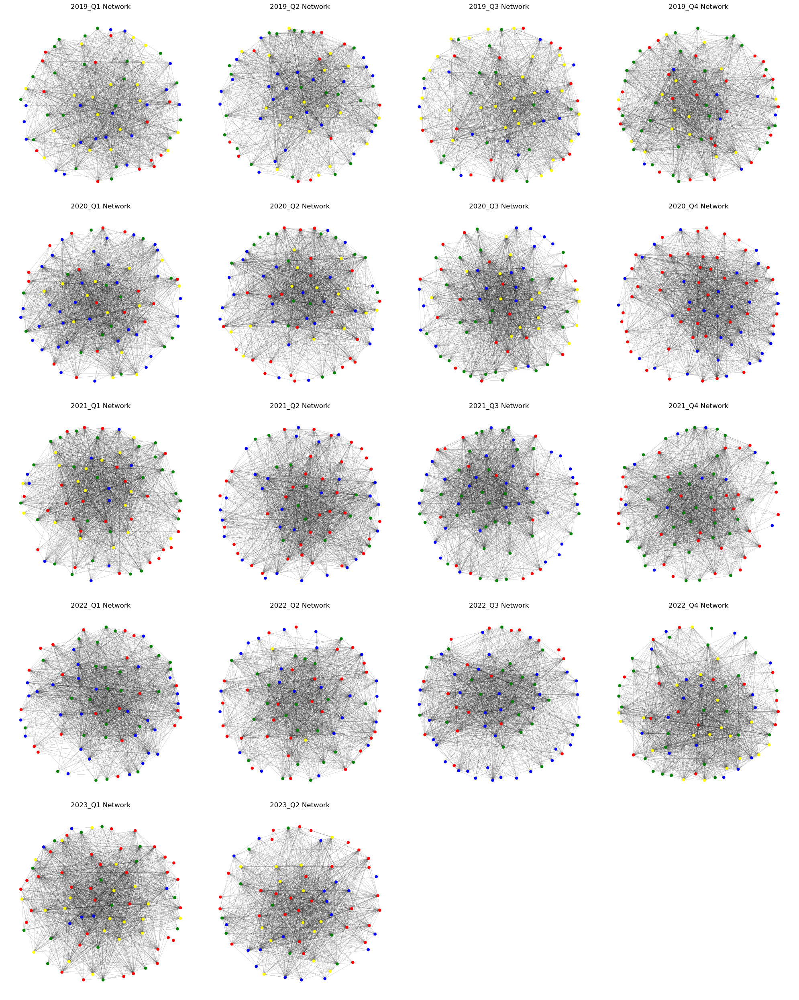

,Quarter,Modularity,TOP 1 Node Name,TOP 1 Node in Same Community,TOP 2 Node Name,TOP 2 Node in Same Community,TOP 3 Node Name,TOP 3 Node in Same Community
0,2019_Q1,0.170727,Wallace Weitz - Weitz Value Fund,True,Polen Capital Management,True,Stephen Mandel - Lone Pine Capital,False
1,2019_Q2,0.170708,Wallace Weitz - Weitz Value Fund,True,Polen Capital Management,True,Glenn Greenberg - Brave Warrior Advisors,False
2,2019_Q3,0.190751,Wallace Weitz - Weitz Value Fund,True,Polen Capital Management,False,Steven Romick - FPA Crescent Fund,False
3,2019_Q4,0.183712,Christopher Davis - Davis Advisors,True,Wallace Weitz - Weitz Value Fund,True,Steven Romick - FPA Crescent Fund,False
4,2020_Q1,0.131474,John Armitage - Egerton Capital,False,Wallace Weitz - Weitz Value Fund,False,Chris Hohn - TCI Fund Management,False
5,2020_Q2,0.139117,David Tepper - Appaloosa Management,False,Wallace Weitz - Weitz Value Fund,False,Chris Hohn - TCI Fund Management,False
6,2020_Q3,0.139305,John Armitage - Egerton Capital,False,David Tepper - Appaloosa Management,False,Wallace Weitz - Weitz Value Fund,False
7,2020_Q4,0.155867,David Tepper - Appaloosa Management,False,John Armitage - Egerton Capital,False,Daniel Loeb - Third Point,False
8,2021_Q1,0.133323,Polen Capital Management,False,John Armitage - Egerton Capital,False,Wallace Weitz - Weitz Value Fund,True
9,2021_Q2,0.132729,Polen Capital Management,False,John Armitage - Egerton Capital,False,Wallace Weitz - Weitz Value Fund,False


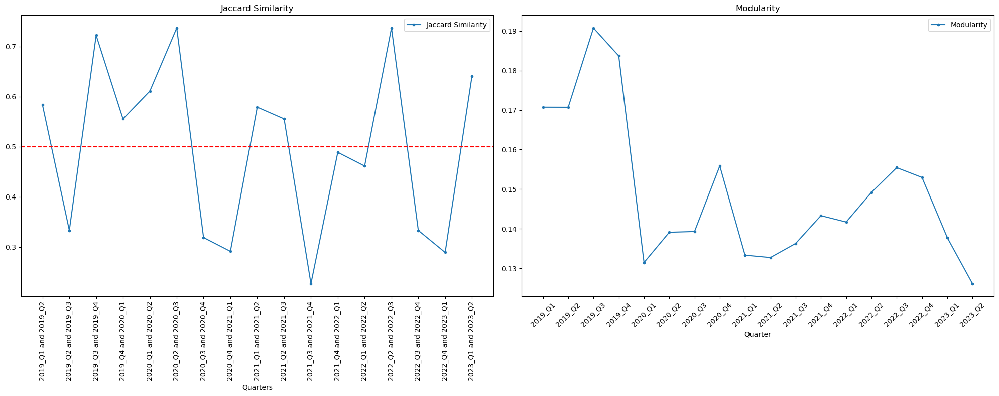

In [43]:
# create a partition map
def create_partition_map(partition):
    partition_map = {}
    for idx, cluster_nodes in enumerate(partition):
        for node in cluster_nodes:
            partition_map[node] = idx
    return partition_map

# get the louvain communities
def get_louvain_communities(G, filename):
    # compute the louvain communities
    communities = nx.community.louvain_communities(G, weight='weight', seed = 1234)
    # compute the modularity of the partition
    modularity = nx.community.quality.modularity(G, communities)
    # create a partition map
    best_partition_map = create_partition_map(communities)

    return {
        'Quarter': os.path.basename(filename).split('.')[0],
        'Modularity': modularity,
        'Community': best_partition_map
    }

# plot the networks
def plot_mark_network(G, title, partition_map, ax):
    node_colors = []
    for node in partition_map:
        if partition_map[node] == 0:
            node_colors.append('red')
        if partition_map[node] == 1:
            node_colors.append('blue')
        if partition_map[node] == 2:
            node_colors.append('green')
        if partition_map[node] == 3:
            node_colors.append('yellow')
        if partition_map[node] == 4:
            node_colors.append('purple')
        if partition_map[node] == 5:
            node_colors.append('orange')

    ax.set_title(title)
    pos = nx.spring_layout(
                            G, 
                            weight='weight',
                            k=6,
                            iterations=100
                        )
    plt.sca(ax)
    nx.draw(
            G, pos, 
            node_color=node_colors, 
            node_size=20,
            width=0.1
            )  

# create empty lists to store the results
community_results = []
whole_network_centrality_results = []
plot_sequence = []

# setup for the plots
fig, axs = plt.subplots(5, 4, figsize=(20, 25))
fig_pos_x = 0
fig_pos_y = 0

# read all the files in the folder
folder_path = './Assignment_Data'
files = os.listdir(folder_path)
files = sorted(files)

for file in files:
    if file.endswith('.xlsx'):
        filename = os.path.join(folder_path, file)
        # setup the whole graph and ego network
        whole_network = setup_network(filename)
        # compute the louvain communities
        communities = get_louvain_communities(whole_network, filename)
        community_results.append(communities)
        # plot the network of this file
        plot_mark_network(whole_network, f'{os.path.basename(filename).split(".")[0]} Network', communities['Community'], axs[fig_pos_y, fig_pos_x])
        # compute the eigenvector centrality for the whole graph
        whole_centrality = get_eigenvector_centrality(whole_network, filename, 3, 'Bruce Berkowitz - Fairholme Capital')
        whole_network_centrality_results.append(whole_centrality)
        # ploting factors
        fig_pos_x += 1
        if fig_pos_x == 4:
            fig_pos_x = 0
            fig_pos_y += 1

# set the last subplot to be invisible
axs[4, 2].set_visible(False)
axs[4, 3].set_visible(False)
# display the network plots
plt.tight_layout()
plt.show()


# store the same community with Bruce Berkowitz - Fairholme Capital
nodes_in_same_community_results = []

for result in community_results:
    index = result['Quarter']
    ego_community = result['Community']['Bruce Berkowitz - Fairholme Capital']
    nodes_in_same_community = [node for node in result['Community'] if result['Community'][node] == ego_community]
    nodes_in_same_community_results.append({'Quarter': index,'Nodes': nodes_in_same_community})

# compare community results
compare_community_results = []

# iterate through each quarter's results
for i in range(len(whole_network_centrality_results)):
    # get the TOP 1 node name and the nodes in the same community for this quarter
    index = whole_network_centrality_results[i]['Quarter']
    top_1_node_name = whole_network_centrality_results[i]['TOP 1 Node Name']
    top_2_node_name = whole_network_centrality_results[i]['TOP 2 Node Name']
    top_3_node_name = whole_network_centrality_results[i]['TOP 3 Node Name']
    nodes_in_same_community = nodes_in_same_community_results[i]['Nodes']
    modularity = community_results[i]['Modularity']

    # check if the nodes name in the same community
    top_1_in = False
    top_2_in = False
    top_3_in = False

    if top_1_node_name in nodes_in_same_community:
        top_1_in = True
    if top_2_node_name in nodes_in_same_community:
        top_2_in = True
    if top_3_node_name in nodes_in_same_community:
        top_3_in = True

    # append the result to the list
    compare_community_results.append({
        'Quarter': index,
        'Modularity': modularity,
        'TOP 1 Node Name': top_1_node_name,
        'TOP 1 Node in Same Community': top_1_in,
        'TOP 2 Node Name': top_2_node_name,
        'TOP 2 Node in Same Community': top_2_in,
        'TOP 3 Node Name': top_3_node_name,
        'TOP 3 Node in Same Community': top_3_in
    })

# convert same_community_results to a pandas dataframe
df = pd.DataFrame(compare_community_results)
# display the table is the top 3 nodes in the same community as Bruce Berkowitz - Fairholme Capital
display(df)

# setup a new figure
fig, axs = plt.subplots(1, 2, figsize=(20, 8))

# calculate the jaccard similarity
def jaccard_similarity(set1, set2):
    intersection = set1.intersection(set2)
    union = set1.union(set2)
    return len(intersection) / len(union)

# calculate the jaccard similarity for each quarter
similarity_results = []
for i in range(len(nodes_in_same_community_results)-1):
    j = i+1
    community1 = nodes_in_same_community_results[i]['Nodes']
    community2 = nodes_in_same_community_results[j]['Nodes']
    quarter1 = nodes_in_same_community_results[i]['Quarter']
    quarter2 = nodes_in_same_community_results[j]['Quarter']
    similarity = jaccard_similarity(set(community1), set(community2))
    # append the result to the list
    similarity_results.append({
        'Quarters': f"{quarter1} and {quarter2}",
        'Jaccard Similarity': similarity
    })

# plot the jaccard similarity
jac_df = pd.DataFrame(similarity_results)
jac_df.plot(ax=axs[0],x='Quarters', y='Jaccard Similarity', kind='line', title='Jaccard Similarity', marker='.')
axs[0].set_xticks(range(len(jac_df['Quarters'])))
axs[0].set_xticklabels(jac_df['Quarters'],rotation=90)
axs[0].axhline(y=0.5, color='r', linestyle='--')

# plot the modularity
mod_df = pd.DataFrame(compare_community_results)
mod_df.plot(ax=axs[1],x='Quarter', y='Modularity', kind='line', title='Modularity', marker='.')
axs[1].set_xticks(range(len(mod_df['Quarter'])))
axs[1].set_xticklabels(mod_df['Quarter'],rotation=45)

plt.tight_layout()
plt.show()
            


**Discuss:**

1. In select the algorithm to find the communities, I used Louvain algorithm. Because I don't know the current number or structure of communities and Louvain algorithm can find the community structure automatically. Secondly Louvain algorithm is able to identify the community structure quickly in large scale networks, which is what we need. So I decided to use Louvain algorithm.
2. In the results, I extracted all the communities containing Bruce Berkowitz - Fairholme Capital and compared the communities to the previous quarter by using Jaccrd Similarity to get a graph that can represent the difference between the communities and the previous quarter's communities. The principle of Jaccrd Similarity is to compare the difference between two sets of communities, if the difference between the two communities is small then the value of Jaccrd Similarity will tend to be 1. Here we consider that when Jaccrd Similarity is less than 0.5 then the two communities are not very relevant. In addition to this, I have also tabulated the modularity of these communities in order to observe the quality of the community.
   - Firstly, it can be seen that the values of modularity are small, and the highest value does not reach 0.2, which indicates that the whole network does not have a high quality of community, showing that the network does not have a clear community structure, and the current distribution of community division is very uniform.
   - Between 2019 Q3 and 2020 Q3 it can be seen that Jaccrd Similarity has held up well, and there is very little differentiation between members within the community, but on the other hand modularity has changed a lot during this time, which shows that there is a lot of change in the community across the whole network. According to Centrality, it's also the period where Bruce Berkowitz - Fairholme Capital has gained a lot of importance. In 2020 Q4 its community has changed a lot, but its importance has still increased, which shows that Bruce Berkowitz - Fairholme Capital has strong management skills at a special time.
   - Overall, from 2019 Q1 to 2023 Q2 Jaccrd Similarity and modularity have been changing without much pattern. This means that the community where Bruce Berkowitz - Fairholme Capital is located is always changing, and the community divisions across the network have also changed significantly. In conclusion, it is possible that Bruce Berkowitz - Fairholme Capital's investment direction has been changing and that it has not yet found an exact investment direction. Moreover, according to the Centrality results above, Bruce Berkowitz - Fairholme Capital has also decreased in importance recently. Of course all investors or companies might have changed a lot, so I think the whole network is still in a state of chaos.

#### Part 6: Report your findings

**Task 6.1 (10 marks)** </br> As any good DBBA Capital data analyst, at the end of your analysis you need to present your fidnings. Please write a brief (~250 words) report discussing how the portfolio of Fairholme Capital has changed compared with the rest of the funds in the dataset.

**REPORT**


Bruce Berkowitz - Fairholme Capital has not been a shining star among all the companies. It has not invested in a large number of companies compared to the top players, but it has shown a very good resilience to risk and the ability to take advantage of particular external circumstances to improve itself. It was able to take advantage of the current situation during the pandemic and quickly raise its importance. In addition to this it was also able to boost its importance against the backdrop of an overall market downturn, which left me very impressed. But portfolio of Fairholme Capital is not static in general, Bruce Berkowitz - Fairholme Capital is more like an opportunist who takes advantage of opportunities to improve himself in a certain period of time, but doesn't have a stable investment direction. The companies which it invests with change all the time, which is not good news for the stability of the investment, and in addition to that its decline in recent quarters is worth keeping an eye on. Overall Bruce Berkowitz - Fairholme Capital is a very noteworthy competitor.The importance has been rising and it has grown very impressively fast during the pandemic.Though it's not the most impressive of all investors right now, but who knows what it could become if it takes another chance.